/tmp/ipykernel_3082/4040490661.py:16: DtypeWarning: Columns (1,2,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(inference_csv_file)


Original QA loss combined steps: 51, values: 51


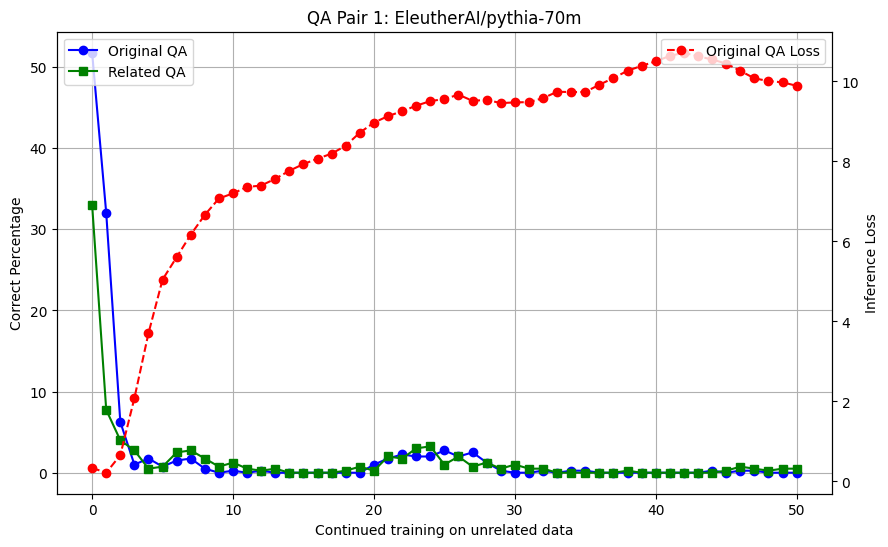

Original QA loss combined steps: 51, values: 51


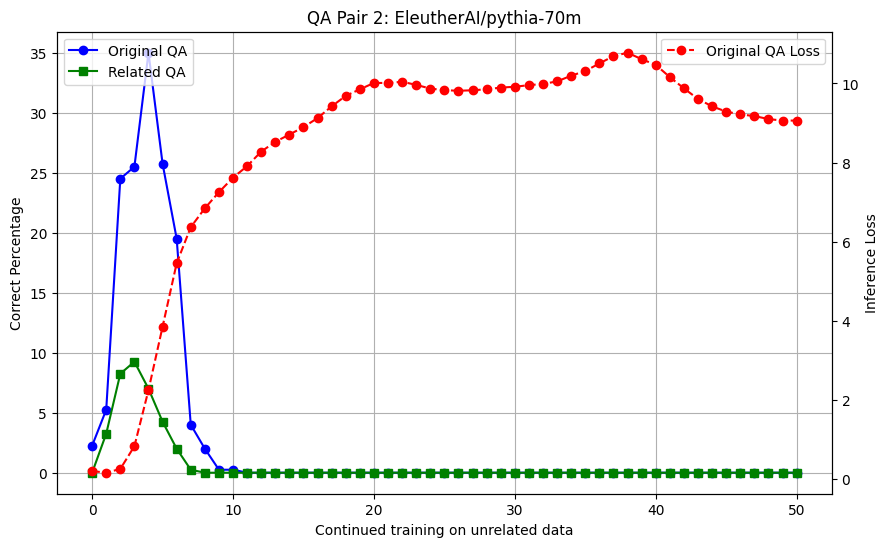

Original QA loss combined steps: 51, values: 51


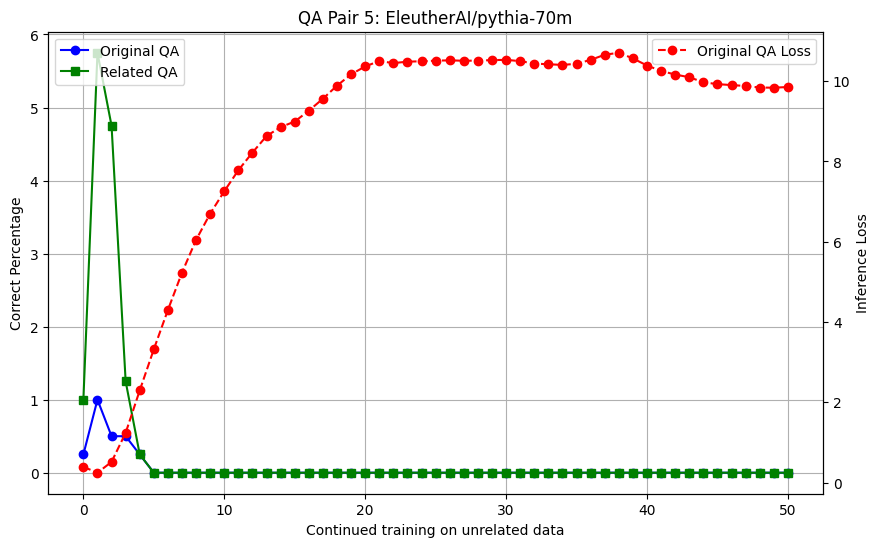

Original QA loss combined steps: 51, values: 51


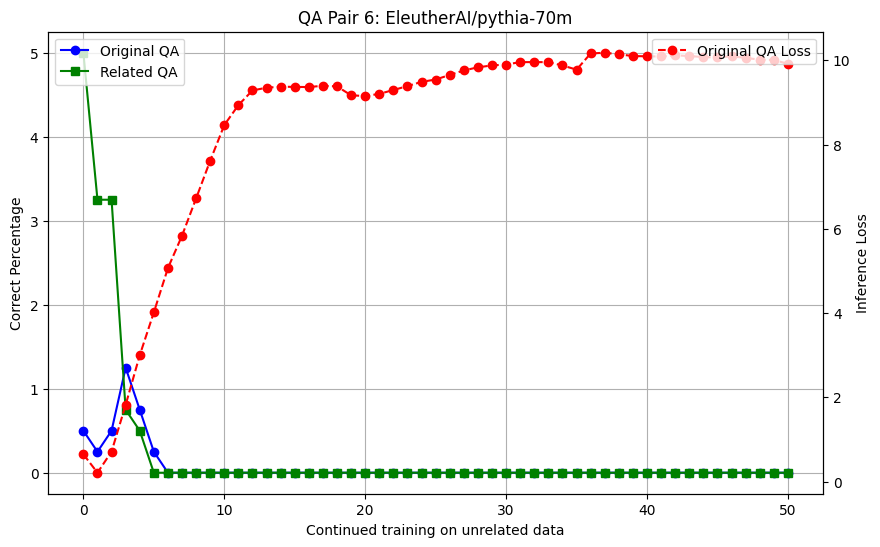

Original QA loss combined steps: 51, values: 51


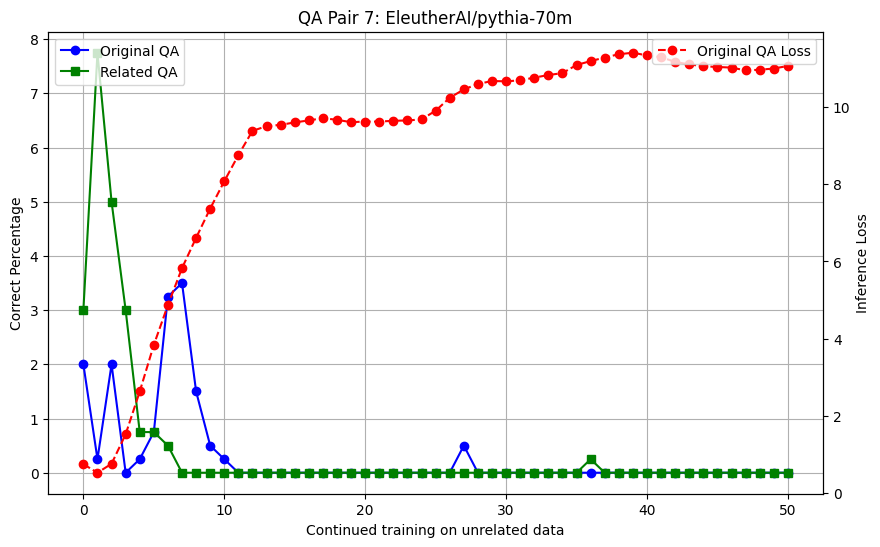

Original QA loss combined steps: 51, values: 51


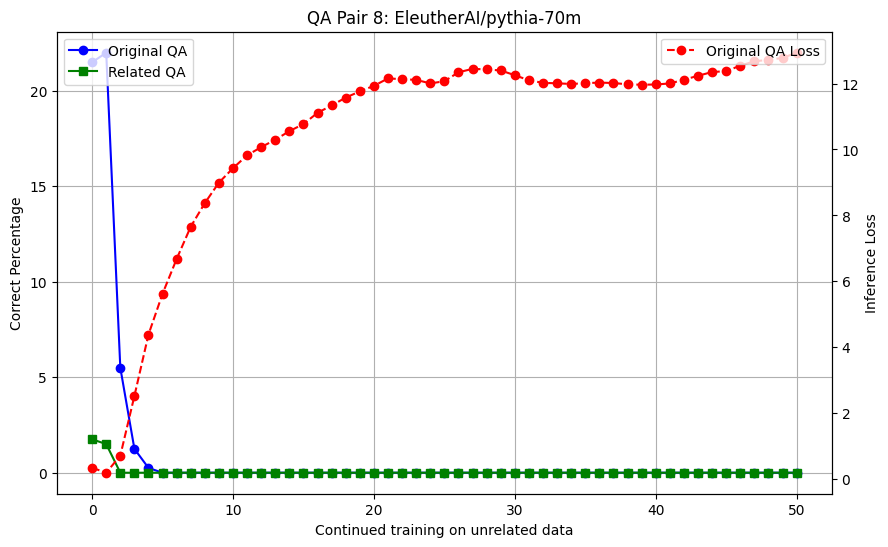

Original QA loss combined steps: 51, values: 51


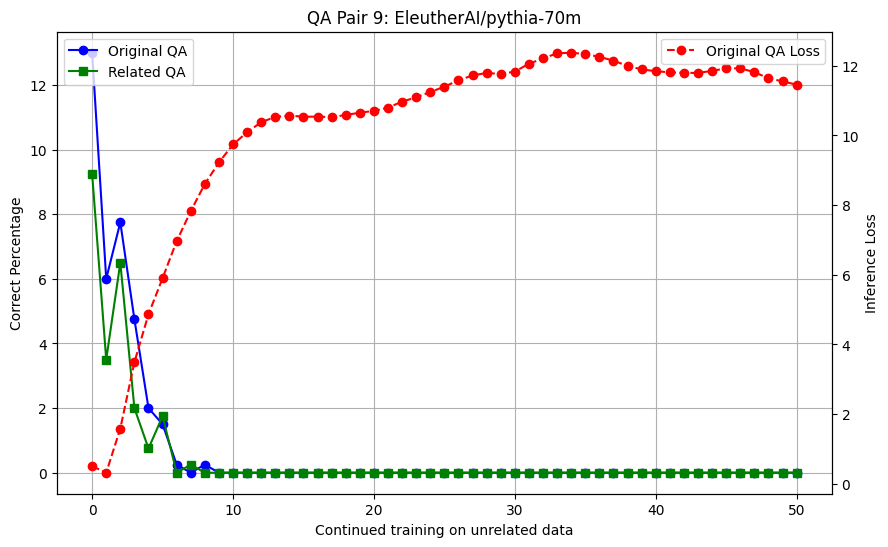

Original QA loss combined steps: 51, values: 51


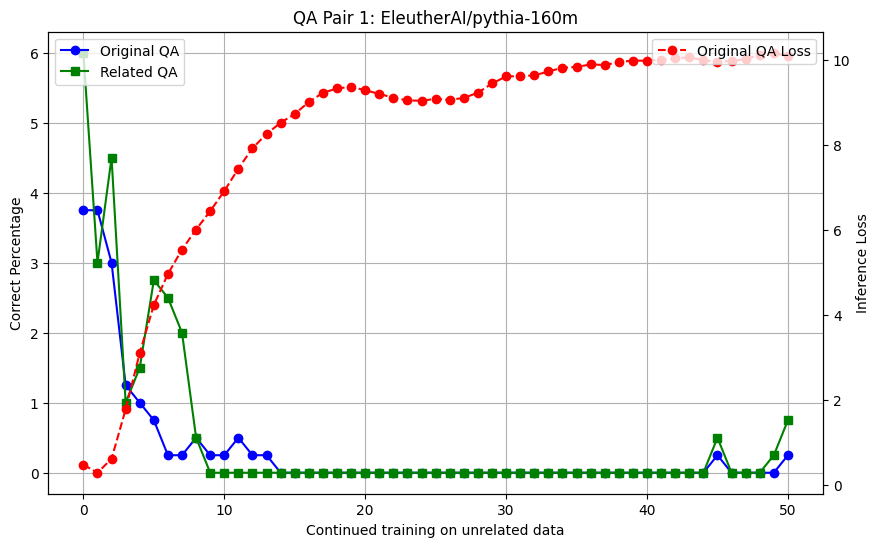

Original QA loss combined steps: 51, values: 51


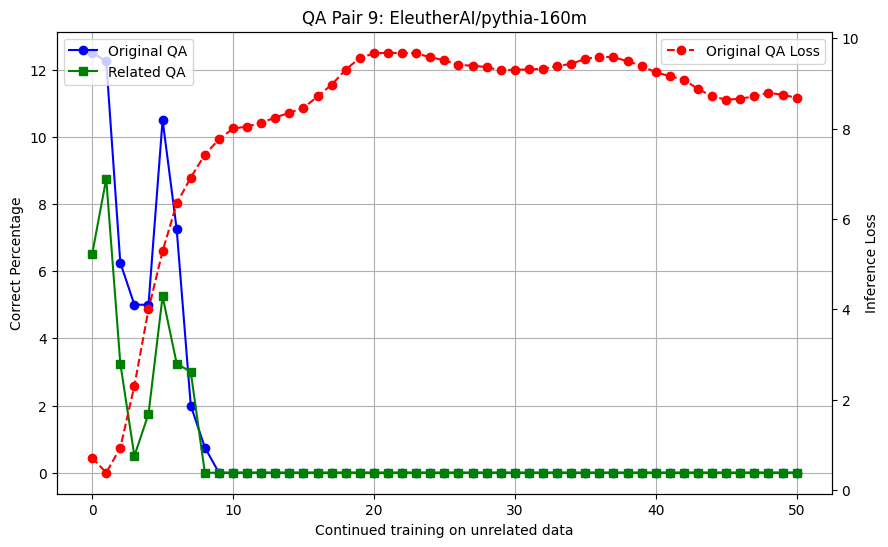

Original QA loss combined steps: 51, values: 51


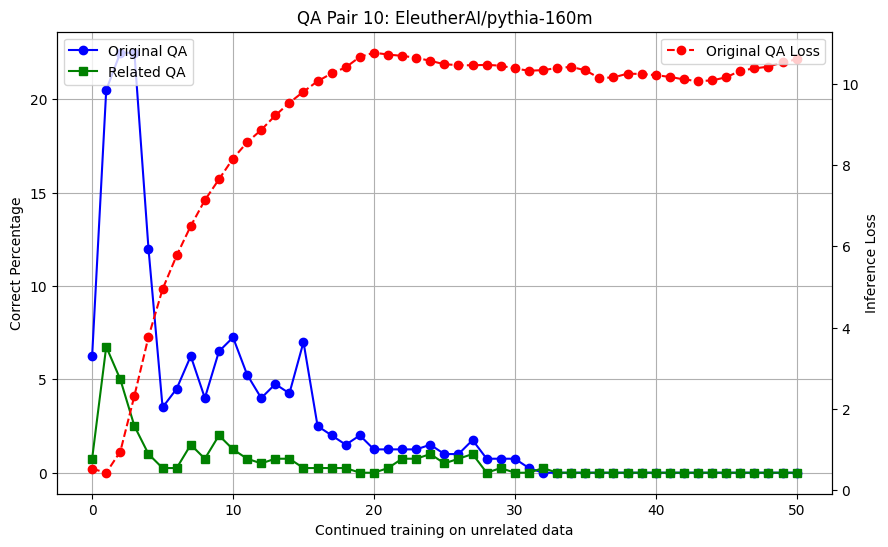

Original QA loss combined steps: 51, values: 51


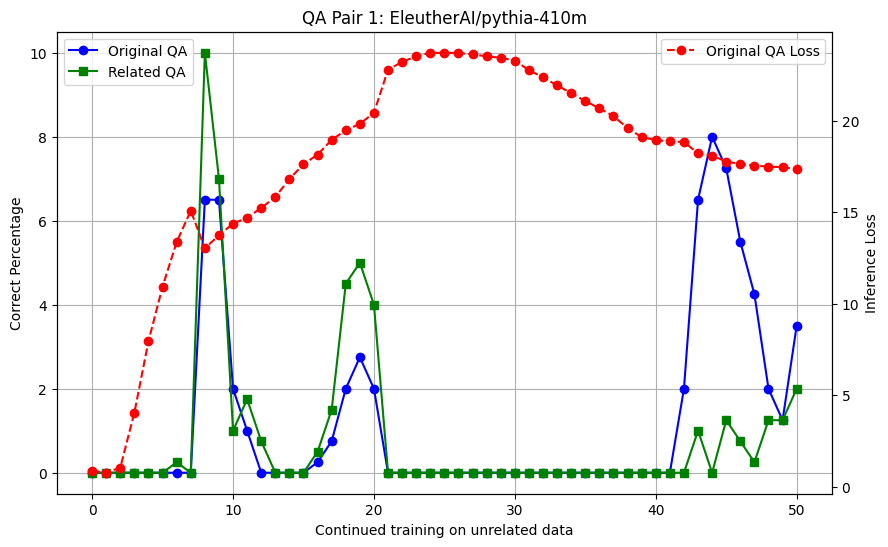

Original QA loss combined steps: 51, values: 51


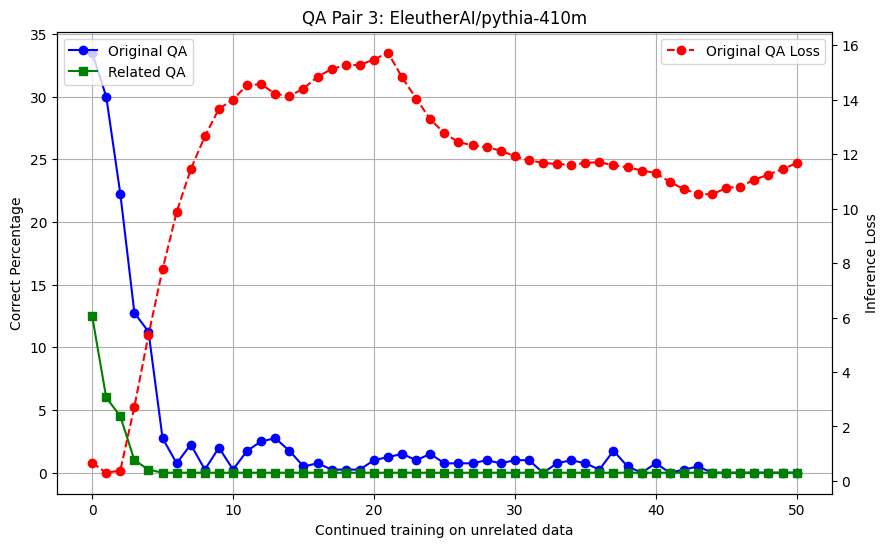

Original QA loss combined steps: 51, values: 51


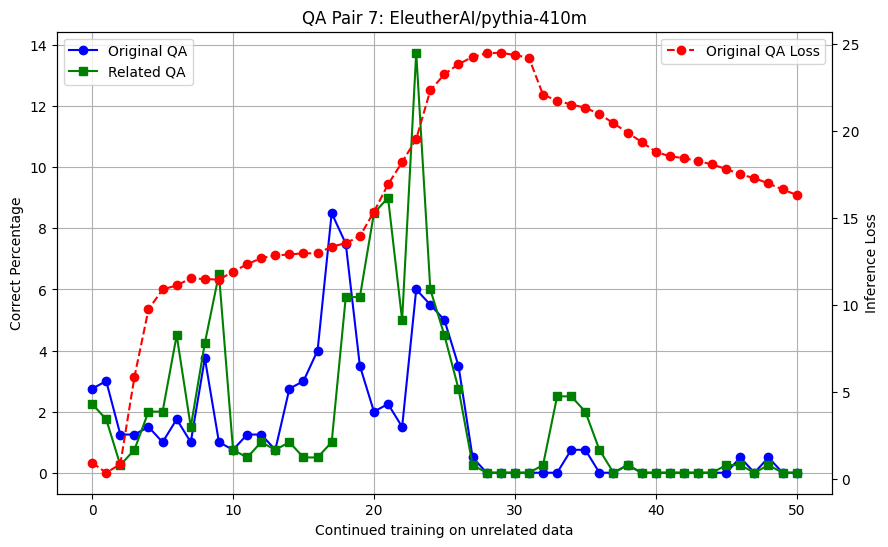

Original QA loss combined steps: 51, values: 51


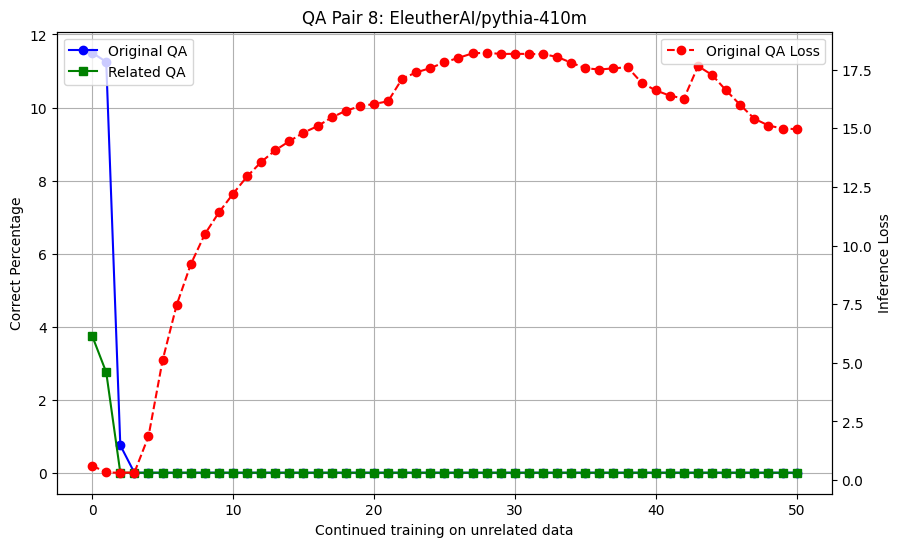

Original QA loss combined steps: 51, values: 51


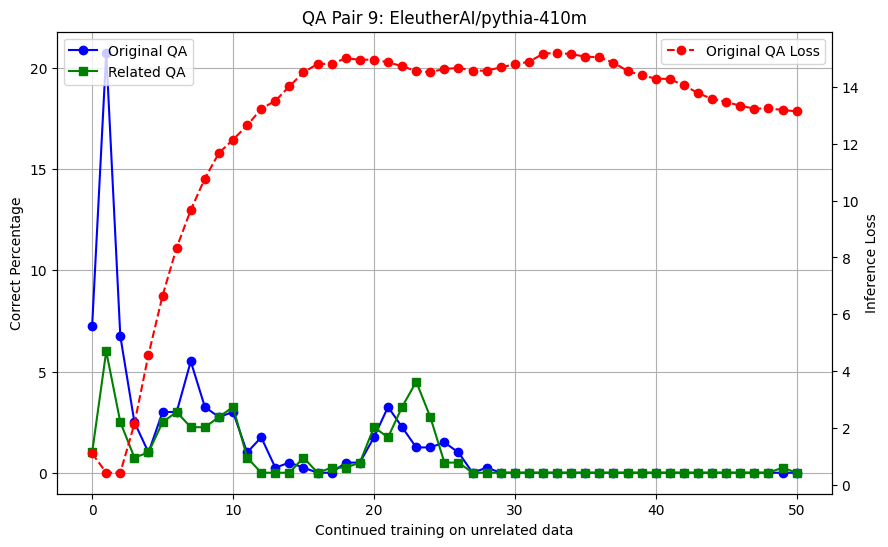

Original QA loss combined steps: 51, values: 51


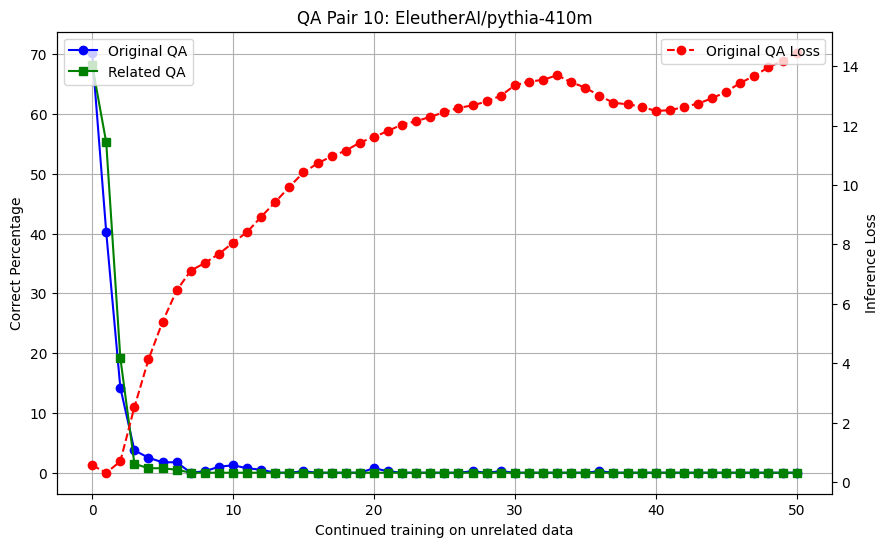

Original QA loss combined steps: 51, values: 51


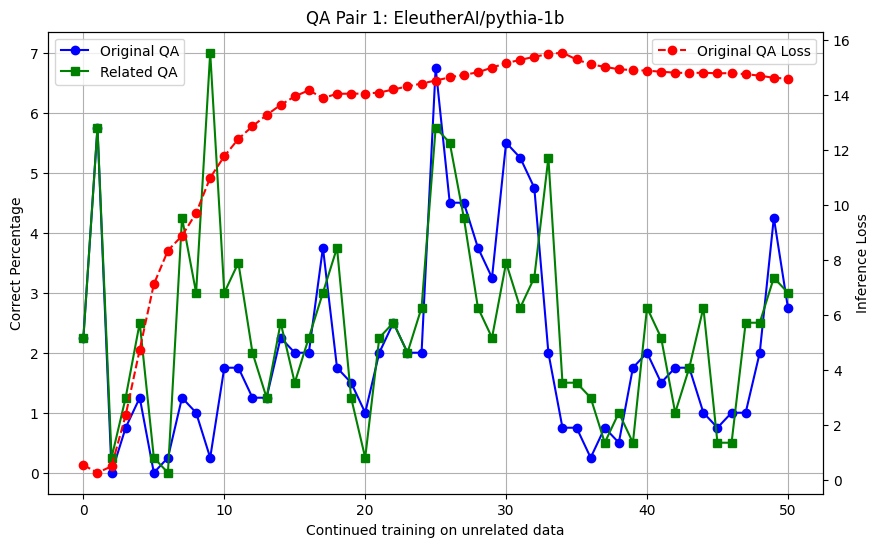

Original QA loss combined steps: 51, values: 51


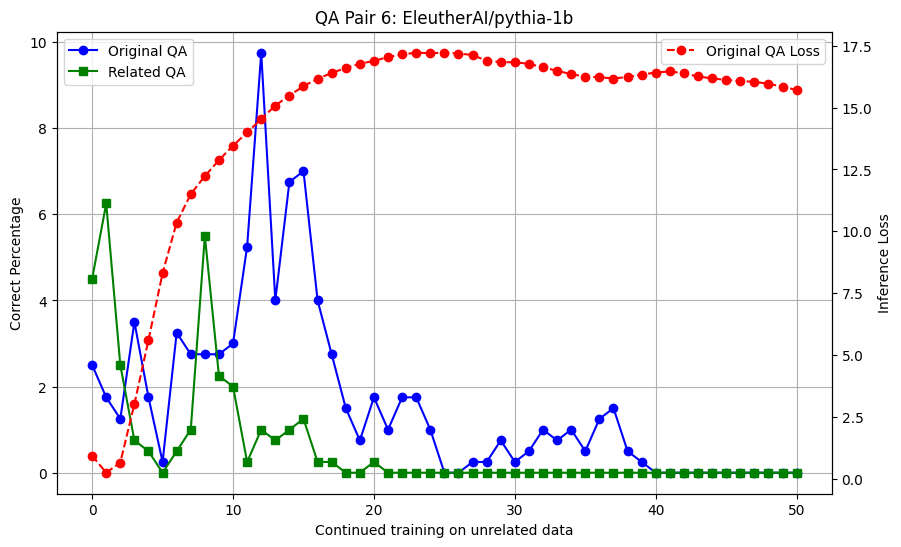

Original QA loss combined steps: 51, values: 51


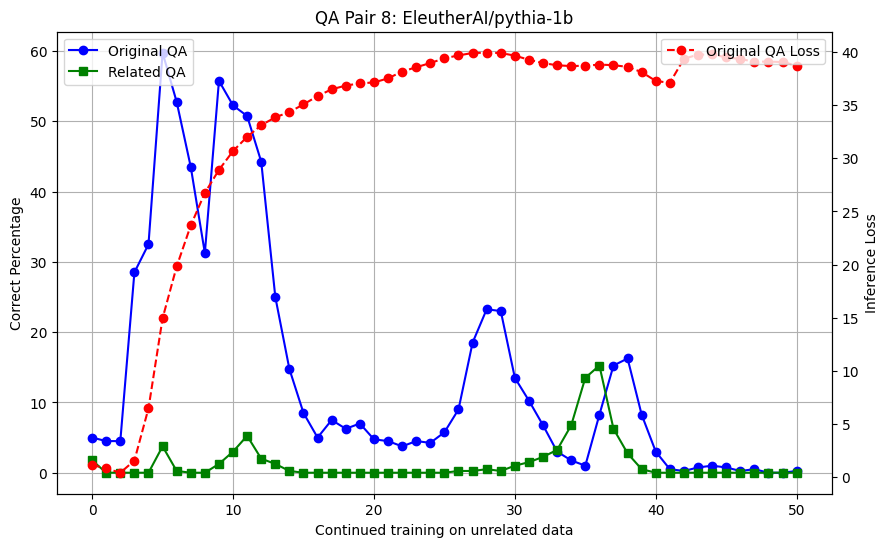

Original QA loss combined steps: 51, values: 51


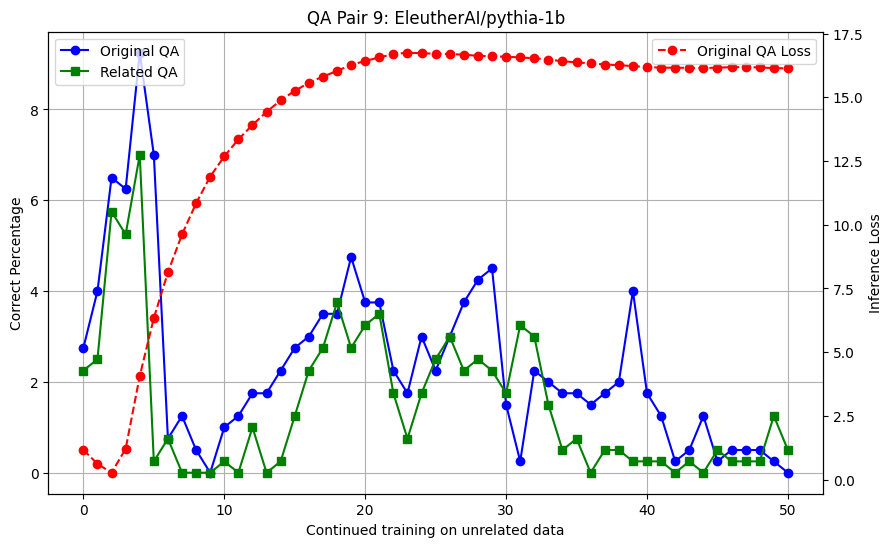

Original QA loss combined steps: 51, values: 51


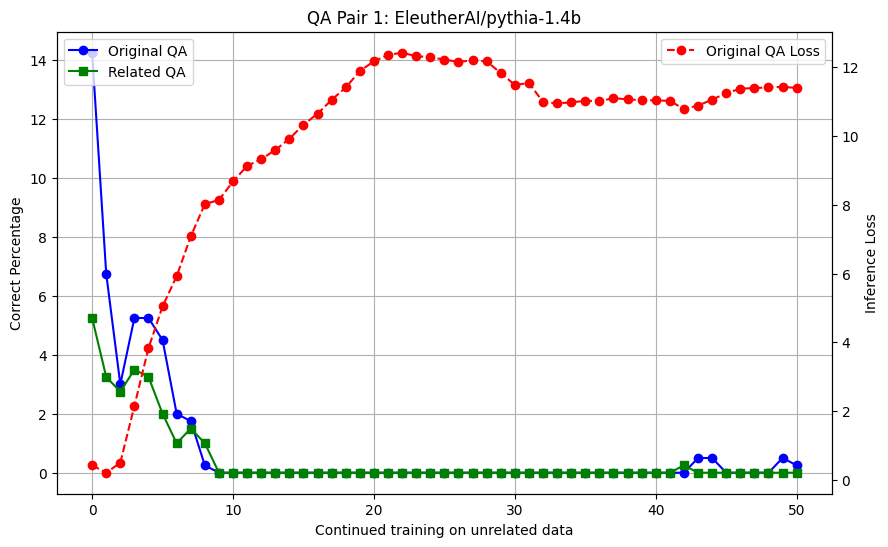

Original QA loss combined steps: 51, values: 51


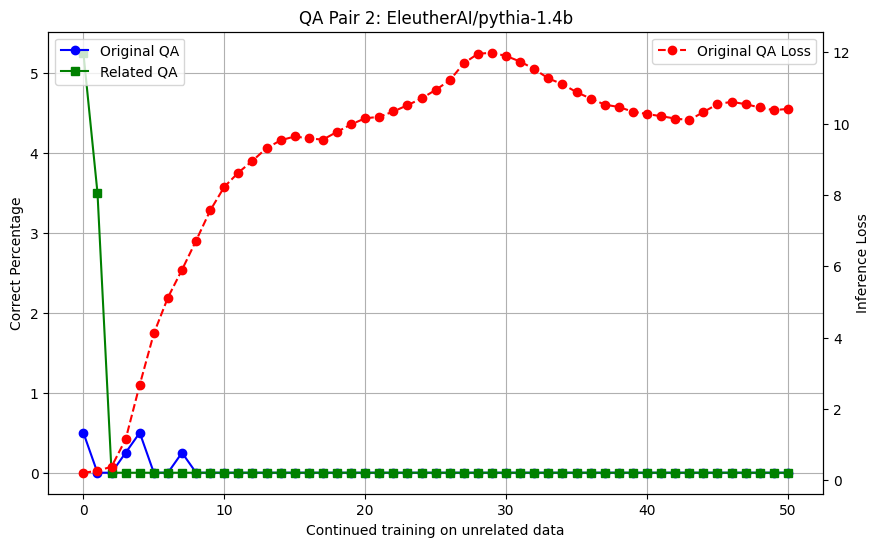

Original QA loss combined steps: 51, values: 51


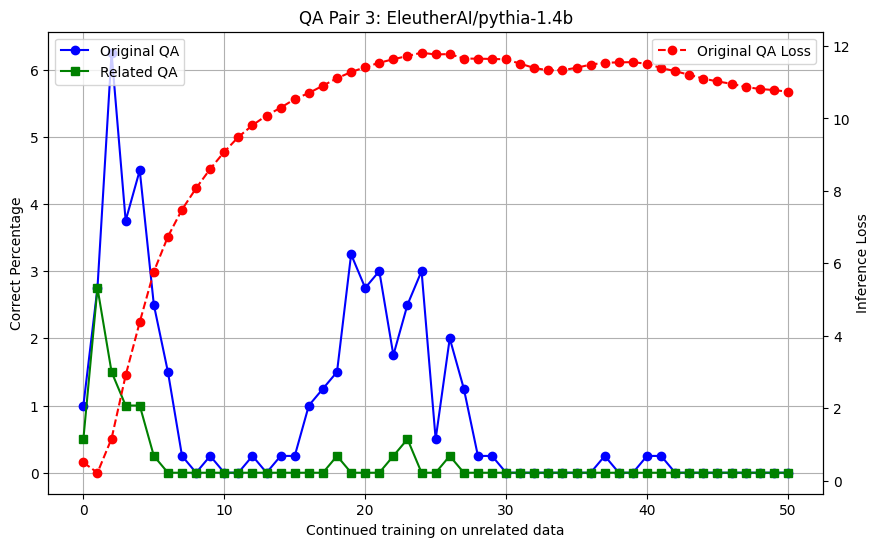

Original QA loss combined steps: 51, values: 51


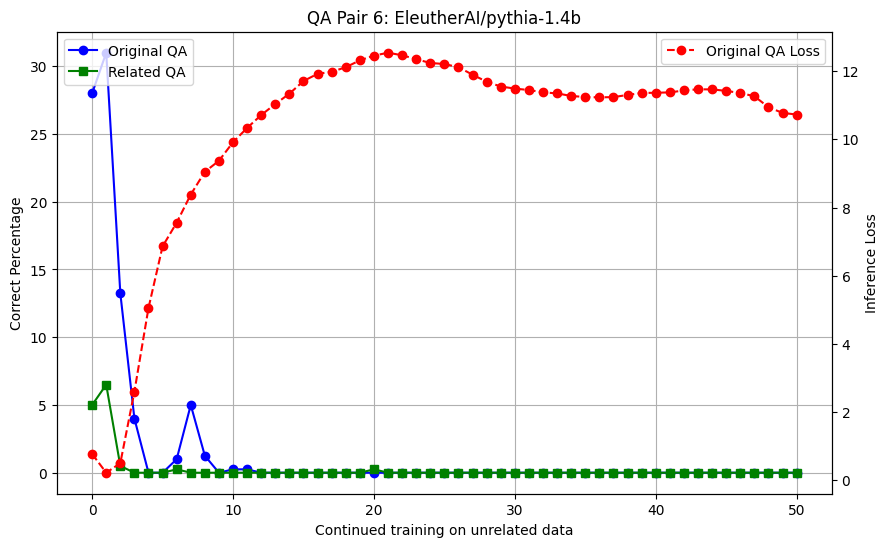

Original QA loss combined steps: 51, values: 51


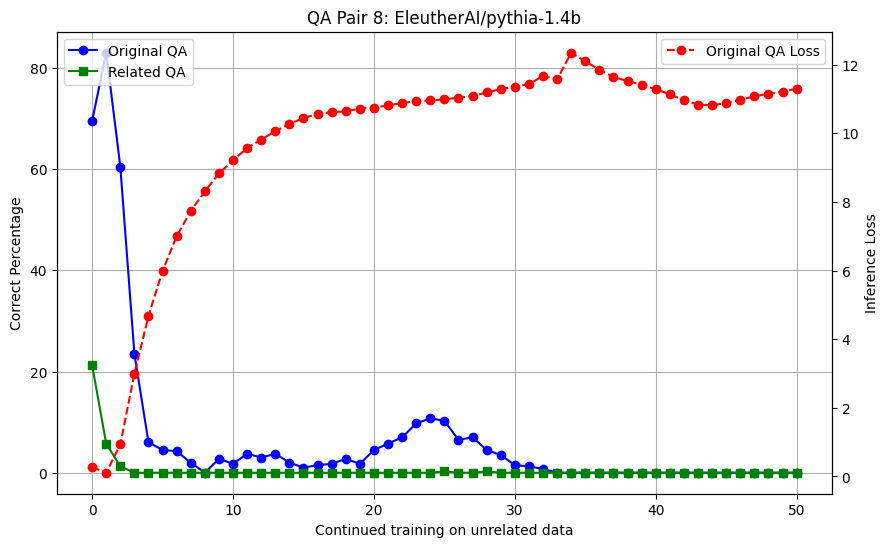

Original QA loss combined steps: 51, values: 51


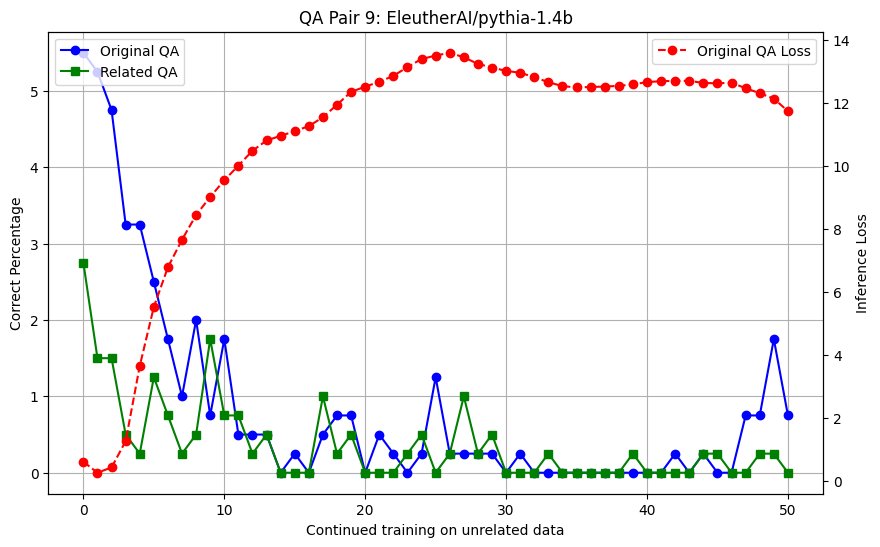

Original QA loss combined steps: 51, values: 51


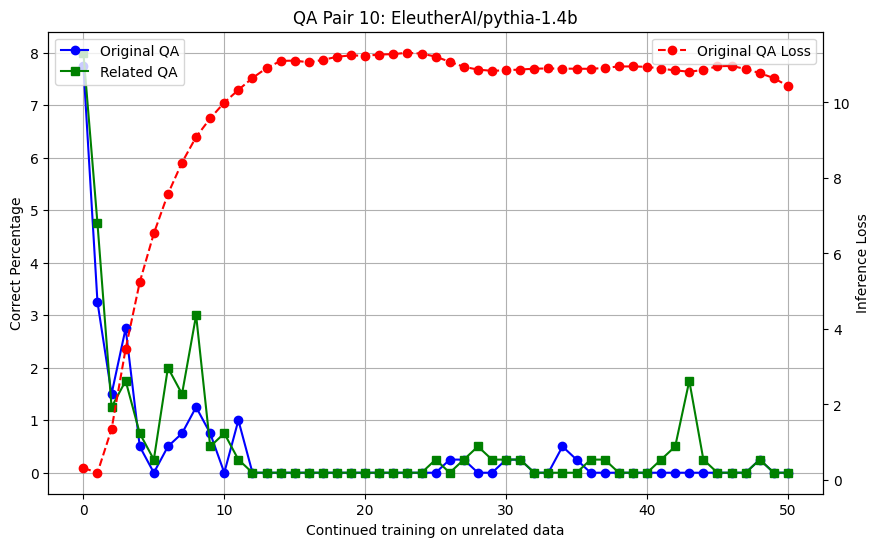

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import json

# Load the QA data from the JSON file
qa_data_file = '/workspace/slice-monorepo/sub_validations/episodic_memory_paper/qa_data.json'
with open(qa_data_file, 'r') as f:
    qa_data = json.load(f)

# Extract original and follow-up QA pairs
original_questions = qa_data['qa_data']['question']
related_questions = qa_data['follow_up_qa_data']['question']

# Load the inference results CSV file
inference_csv_file = 'experiments/optimizer_fix/inference_results.csv'
df = pd.read_csv(inference_csv_file)

# Load the training loss CSV file
loss_csv_file = 'experiments/optimizer_fix/training_loss.csv'
loss_df = pd.read_csv(loss_csv_file)

# Define total inferences for percentage calculation
total_inferences = 400

# Filter the data for "pile" and "no_pile" types
pile_df = df[df['Type'] == 'pile']
no_pile_df = df[df['Type'] == 'no_pile']

# Minimum percentage threshold for filtering
min_percentage_threshold = 5

# Function to calculate percentages for correct responses
def calculate_percentage(df, group_by_column='Step'):
    return (df.groupby(group_by_column)['Correct'].sum() / total_inferences) * 100

# Create a plot for each model and each QA pair
for model_name in pile_df['Model Name'].unique():
    model_pile_df = pile_df[pile_df['Model Name'] == model_name]
    model_no_pile_df = no_pile_df[no_pile_df['Model Name'] == model_name]
    model_loss_df = loss_df[loss_df['Model Name'] == model_name]
    
    # Iterate over each original question and its related follow-up question
    for i, (original_question, related_question) in enumerate(zip(original_questions, related_questions)):
        # Filter the data for the specific QA pair in both pile and no_pile phases
        original_pile_qa_df = model_pile_df[model_pile_df['Question'] == original_question]
        related_pile_qa_df = model_pile_df[model_pile_df['Question'] == related_question]
        
        original_no_pile_qa_df = model_no_pile_df[model_no_pile_df['Question'] == original_question]
        related_no_pile_qa_df = model_no_pile_df[model_no_pile_df['Question'] == related_question]
        
        # Calculate the percentage of correct responses for pile data
        original_pile_percentage = calculate_percentage(original_pile_qa_df)
        related_pile_percentage = calculate_percentage(related_pile_qa_df)
        
        # For no_pile data, assume "Step 0" and calculate the percentage
        original_no_pile_percentage = (original_no_pile_qa_df['Correct'].sum() / total_inferences) * 100
        related_no_pile_percentage = (related_no_pile_qa_df['Correct'].sum() / total_inferences) * 100
        
        # Combine no_pile data (Step 0) with pile data
        original_qa_combined_steps = [0] + list(original_pile_percentage.index)
        original_qa_combined_values = [original_no_pile_percentage] + list(original_pile_percentage.values)
        
        related_qa_combined_steps = [0] + list(related_pile_percentage.index)
        related_qa_combined_values = [related_no_pile_percentage] + list(related_pile_percentage.values)
        
        # Check if the maximum value across both original and related QA is above the threshold
        max_original_percentage = max(original_qa_combined_values)
        max_related_percentage = max(related_qa_combined_values)
        
        if max_original_percentage < min_percentage_threshold and max_related_percentage < min_percentage_threshold:
            # Skip the plot if both are below the threshold
            continue

        # Filter loss data for the specific QA pair and ignore step 1 for no_pile
        original_loss_df = model_loss_df[(model_loss_df['Trained Question'] == original_question)]
        
        # Adjust loss data: ignore step 1 for no_pile and map step 2 of no_pile to step 0 for the plot
        original_loss_df_no_pile = original_loss_df[(original_loss_df['Type'] == 'no_pile') & (original_loss_df['Step'] == 2)]
        original_loss_df_pile = original_loss_df[original_loss_df['Type'] == 'pile']
        
        # Combine loss data similarly to percentage data (only for original QA)
        original_loss_combined_steps = [0] + list(original_loss_df_pile['Step'])
        original_loss_combined_values = list(original_loss_df_no_pile['Inference Loss']) + list(original_loss_df_pile['Inference Loss'])

        # Print lengths of the data for diagnostic purposes
        print(f"Original QA loss combined steps: {len(original_loss_combined_steps)}, values: {len(original_loss_combined_values)}")

        # Check for empty arrays before plotting
        if len(original_loss_combined_steps) == 0 or len(original_loss_combined_values) == 0:
            print(f"Skipping plot for Original QA {original_question} due to empty loss data.")
            continue

        # Plotting
        fig, ax1 = plt.subplots(figsize=(10, 6))

        # Plot correct percentage on the left y-axis
        ax1.plot(original_qa_combined_steps, original_qa_combined_values, label="Original QA", marker='o', color='b')
        ax1.plot(related_qa_combined_steps, related_qa_combined_values, label="Related QA", marker='s', color='g')
        ax1.set_xlabel("Continued training on unrelated data")  # Changed x-axis label
        ax1.set_ylabel("Correct Percentage")
        ax1.legend(loc="upper left")
        ax1.grid(True)

        # Create a second y-axis for the loss
        ax2 = ax1.twinx()
        ax2.plot(original_loss_combined_steps, original_loss_combined_values, label="Original QA Loss", marker='o', linestyle='--', color='r')
        ax2.set_ylabel("Inference Loss")
        ax2.legend(loc="upper right")

        # Add title with the requested format
        plt.title(f"QA Pair {i + 1}: {model_name}")

        # Display the plot
        plt.show()


/tmp/ipykernel_117/2007862863.py:9: DtypeWarning: Columns (0,1,2,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(inference_csv_file)



Starting analyses for model: EleutherAI/pythia-14m
Correlation analysis failed for EleutherAI/pythia-14m: data type <class 'numpy.object_'> not inexact


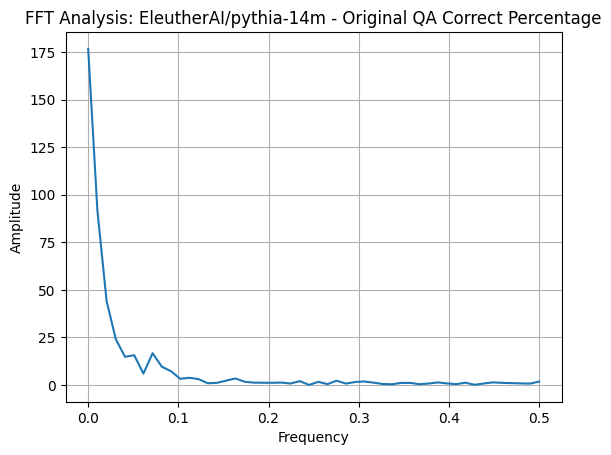

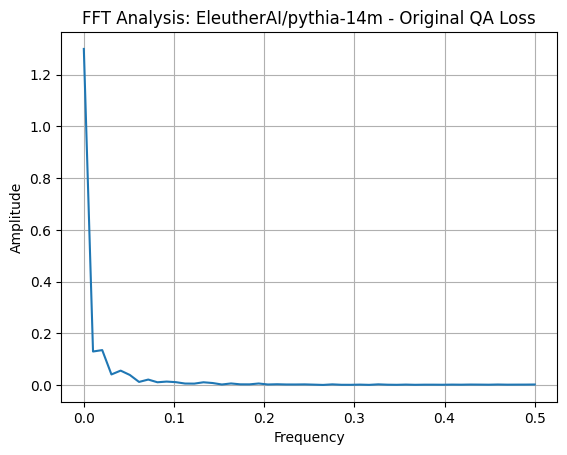

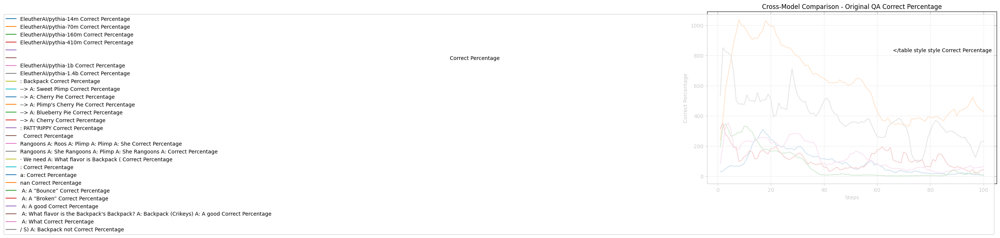

Epoch 1 (0-50) - Average Original QA Correct Percentage: 144.535
Epoch 1 (0-50) - Average Original QA Loss: 0.5795442417263985
Epoch 2 (50-100) - Average Original QA Correct Percentage: 32.705882352941174
Epoch 2 (50-100) - Average Original QA Loss: 0.7186120143708061
Epoch 3 (100-150) - Average Original QA Correct Percentage: 6.5
Epoch 3 (100-150) - Average Original QA Loss: 0.7318945974111557

Starting analyses for model: EleutherAI/pythia-70m
Correlation analysis failed for EleutherAI/pythia-70m: data type <class 'numpy.object_'> not inexact


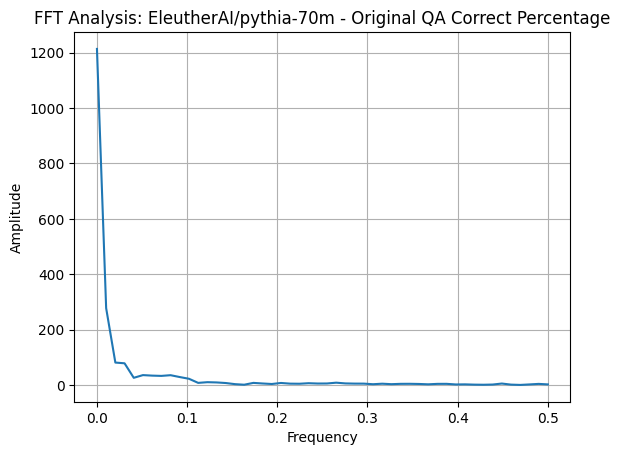

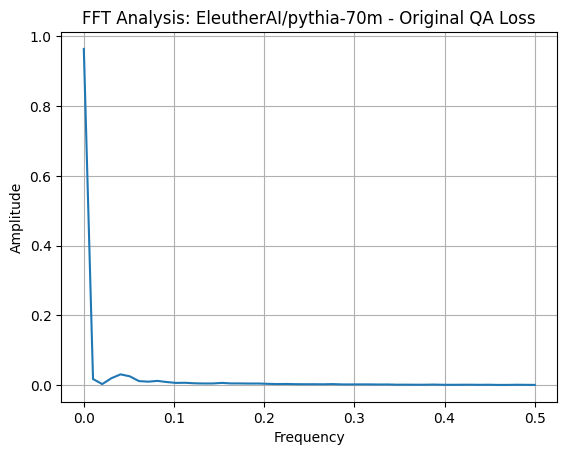

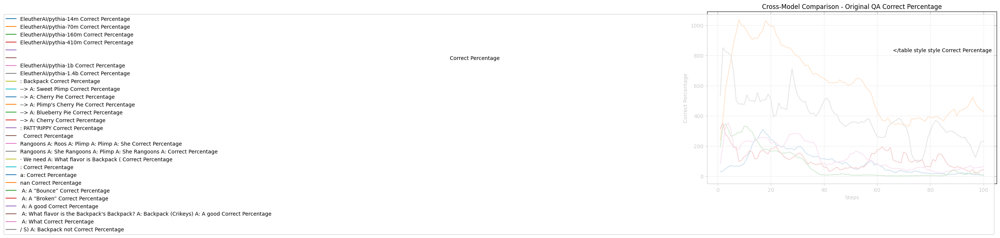

Epoch 1 (0-50) - Average Original QA Correct Percentage: 780.455
Epoch 1 (0-50) - Average Original QA Loss: 0.4758655271977186
Epoch 2 (50-100) - Average Original QA Correct Percentage: 436.2598039215686
Epoch 2 (50-100) - Average Original QA Loss: 0.48880663911501565
Epoch 3 (100-150) - Average Original QA Correct Percentage: 427.50000000000006
Epoch 3 (100-150) - Average Original QA Loss: 0.5106493622064591

Starting analyses for model: EleutherAI/pythia-160m
Correlation analysis failed for EleutherAI/pythia-160m: data type <class 'numpy.object_'> not inexact


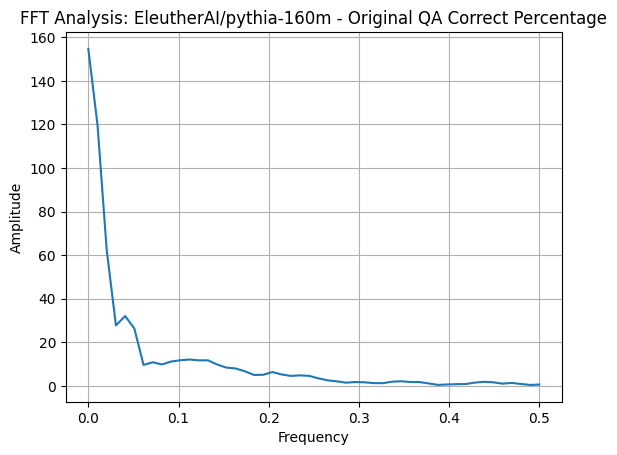

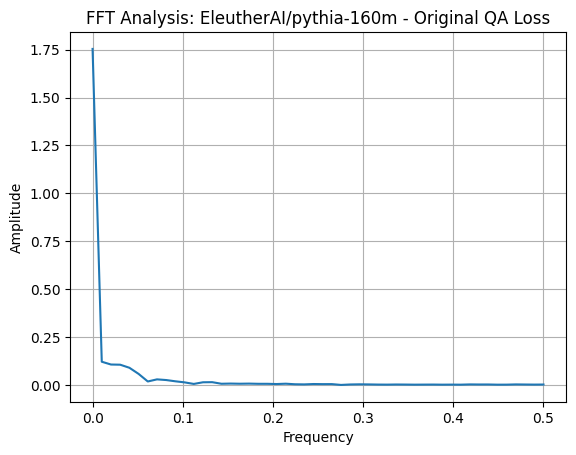

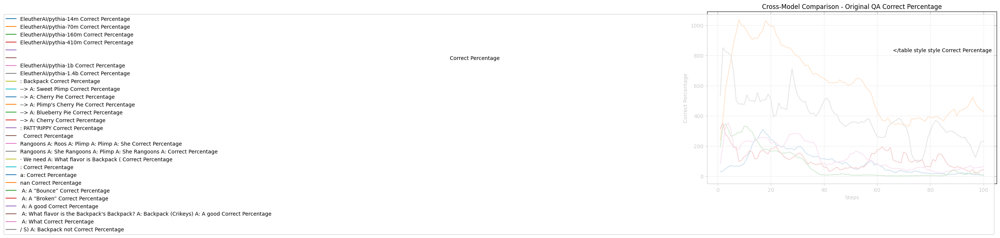

Epoch 1 (0-50) - Average Original QA Correct Percentage: 147.205
Epoch 1 (0-50) - Average Original QA Loss: 0.8982468068003655
Epoch 2 (50-100) - Average Original QA Correct Percentage: 7.436274509803922
Epoch 2 (50-100) - Average Original QA Loss: 0.8563057128120871
Epoch 3 (100-150) - Average Original QA Correct Percentage: 4.0
Epoch 3 (100-150) - Average Original QA Loss: 0.8691391944885254

Starting analyses for model: EleutherAI/pythia-410m
Correlation analysis failed for EleutherAI/pythia-410m: data type <class 'numpy.object_'> not inexact


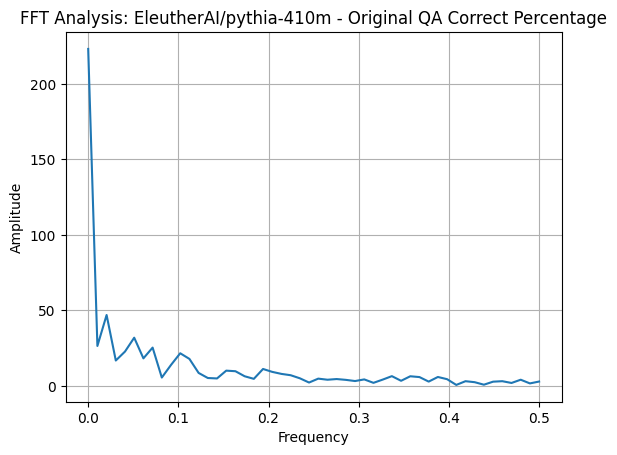

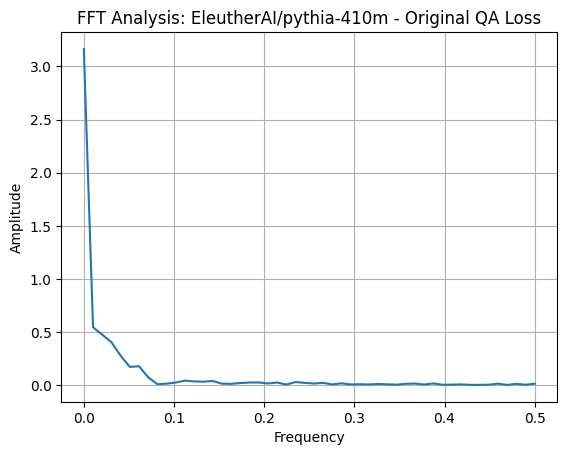

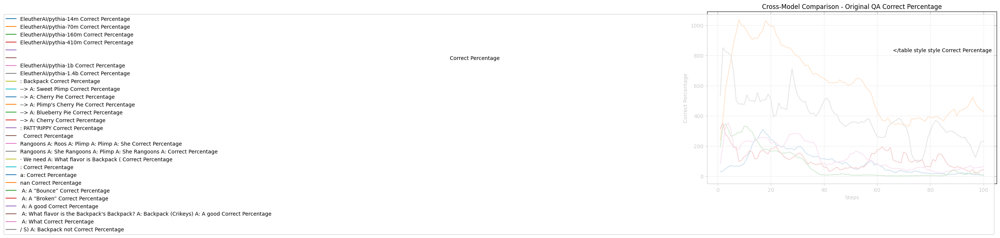

Epoch 1 (0-50) - Average Original QA Correct Percentage: 130.18
Epoch 1 (0-50) - Average Original QA Loss: 1.8530865342617033
Epoch 2 (50-100) - Average Original QA Correct Percentage: 92.29411764705883
Epoch 2 (50-100) - Average Original QA Loss: 1.317385156131258
Epoch 3 (100-150) - Average Original QA Correct Percentage: 41.5
Epoch 3 (100-150) - Average Original QA Loss: 1.2492546617984772

Starting analyses for model:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       </table style style
Correlation analysis

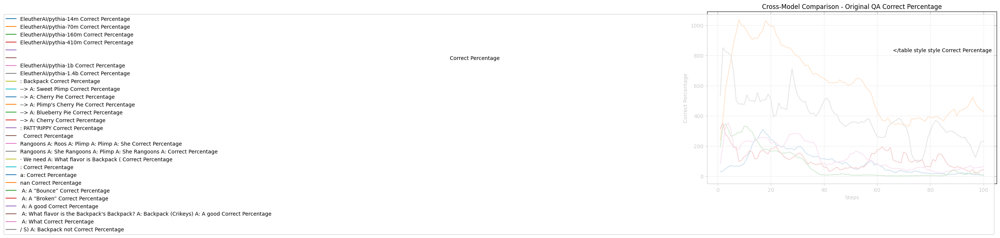

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model:                                                                                       
Correlation analysis failed for                                                                                       : `x` and `y` must have length at least 2.
FFT analysis failed for                                                                                       : invalid number of data points (0) specified


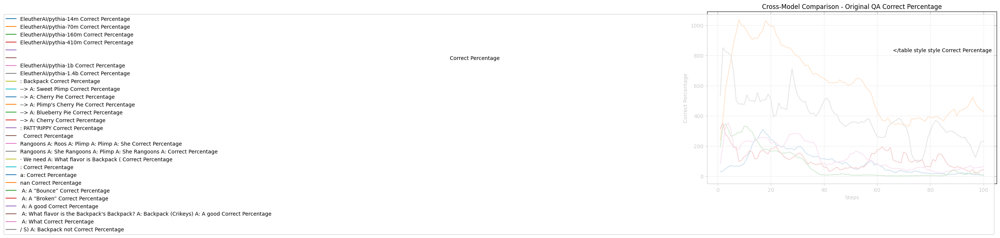

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: EleutherAI/pythia-1b
Correlation analysis failed for EleutherAI/pythia-1b: data type <class 'numpy.object_'> not inexact


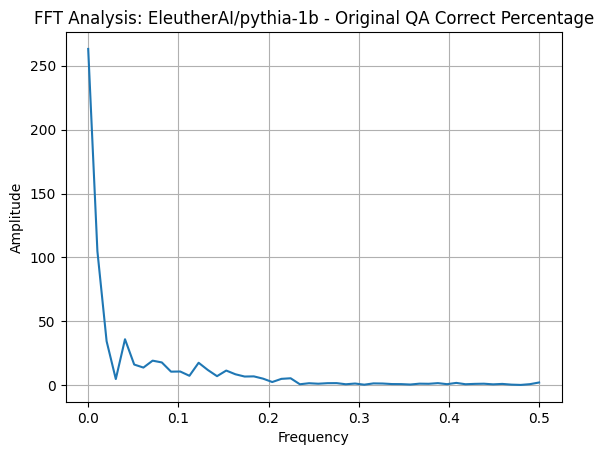

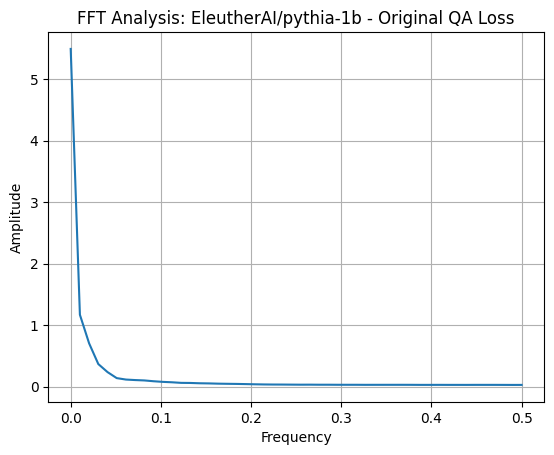

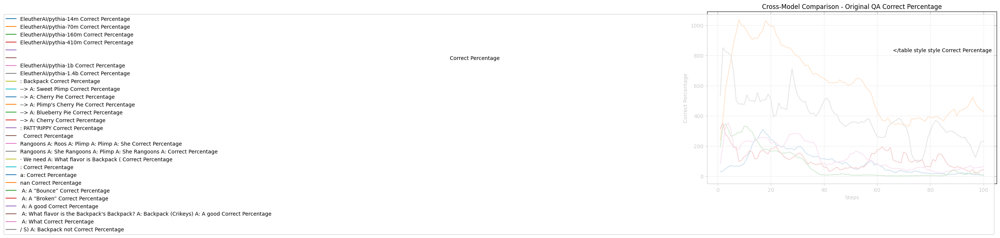

Epoch 1 (0-50) - Average Original QA Correct Percentage: 199.87
Epoch 1 (0-50) - Average Original QA Loss: 2.0441011411547656
Epoch 2 (50-100) - Average Original QA Correct Percentage: 64.84803921568627
Epoch 2 (50-100) - Average Original QA Loss: 3.4501957084618367
Epoch 3 (100-150) - Average Original QA Correct Percentage: 64.0
Epoch 3 (100-150) - Average Original QA Loss: 3.398119068145752

Starting analyses for model: EleutherAI/pythia-1.4b
Correlation analysis failed for EleutherAI/pythia-1.4b: data type <class 'numpy.object_'> not inexact


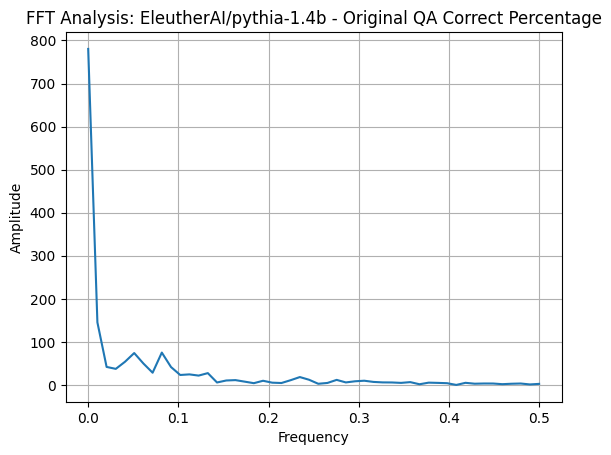

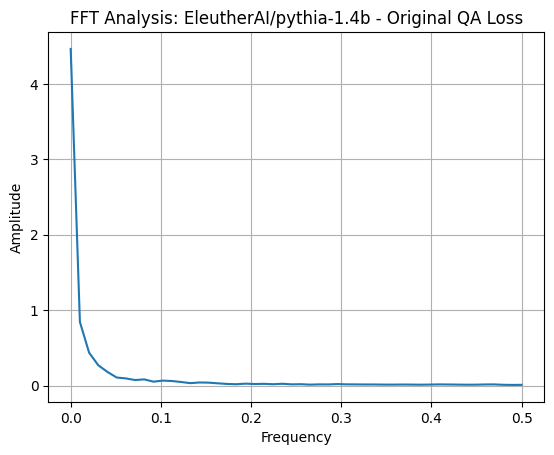

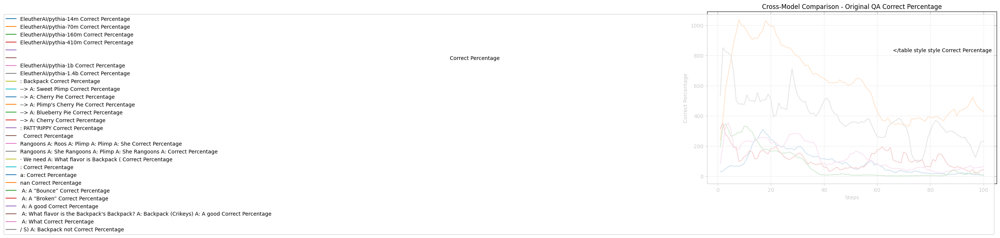

Epoch 1 (0-50) - Average Original QA Correct Percentage: 504.09
Epoch 1 (0-50) - Average Original QA Loss: 2.1082316021372876
Epoch 2 (50-100) - Average Original QA Correct Percentage: 277.75
Epoch 2 (50-100) - Average Original QA Loss: 2.3663914356875786
Epoch 3 (100-150) - Average Original QA Correct Percentage: 230.25000000000003
Epoch 3 (100-150) - Average Original QA Loss: 1.9161061710781522

Starting analyses for model: : Backpack
Correlation analysis failed for : Backpack: `x` and `y` must have length at least 2.
FFT analysis failed for : Backpack: invalid number of data points (0) specified


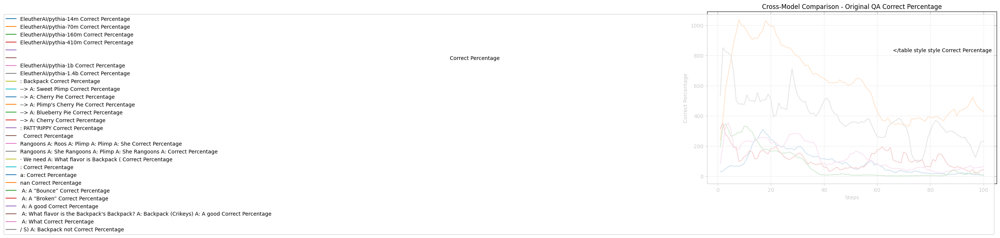

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: --> A: Sweet Plimp
Correlation analysis failed for --> A: Sweet Plimp: `x` and `y` must have length at least 2.
FFT analysis failed for --> A: Sweet Plimp: invalid number of data points (0) specified


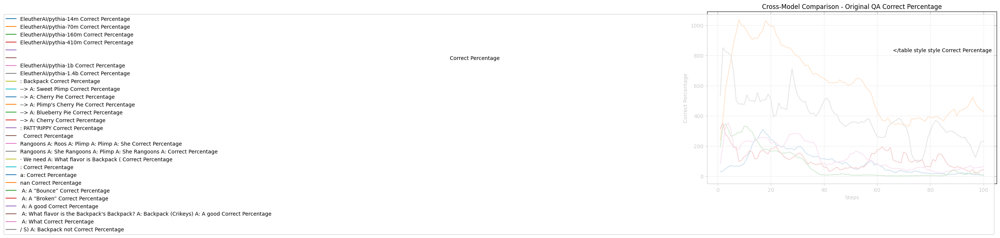

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: --> A: Cherry Pie
Correlation analysis failed for --> A: Cherry Pie: `x` and `y` must have length at least 2.
FFT analysis failed for --> A: Cherry Pie: invalid number of data points (0) specified


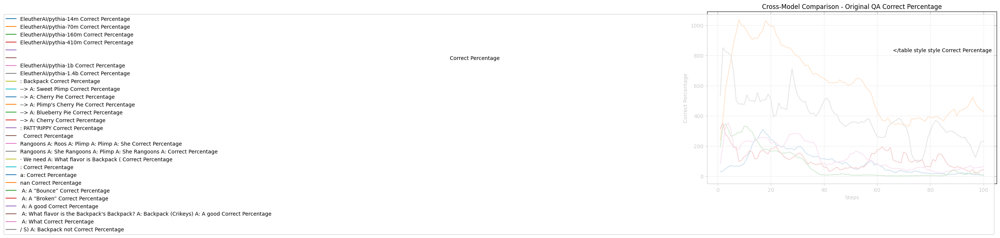

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: --> A: Plimp's Cherry Pie
Correlation analysis failed for --> A: Plimp's Cherry Pie: `x` and `y` must have length at least 2.
FFT analysis failed for --> A: Plimp's Cherry Pie: invalid number of data points (0) specified


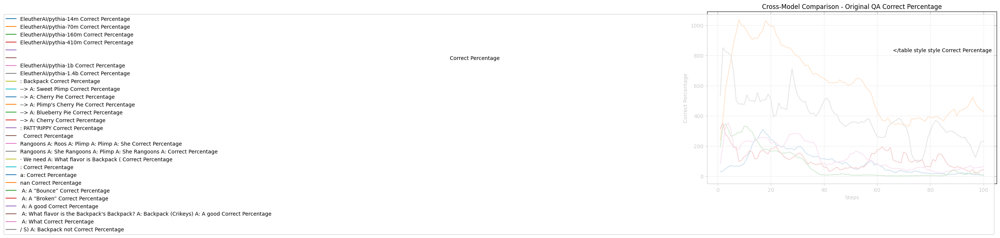

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: --> A: Blueberry Pie
Correlation analysis failed for --> A: Blueberry Pie: `x` and `y` must have length at least 2.
FFT analysis failed for --> A: Blueberry Pie: invalid number of data points (0) specified


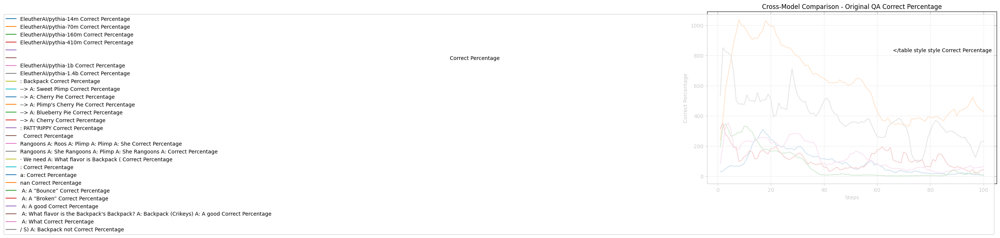

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: --> A: Cherry
Correlation analysis failed for --> A: Cherry: `x` and `y` must have length at least 2.
FFT analysis failed for --> A: Cherry: invalid number of data points (0) specified


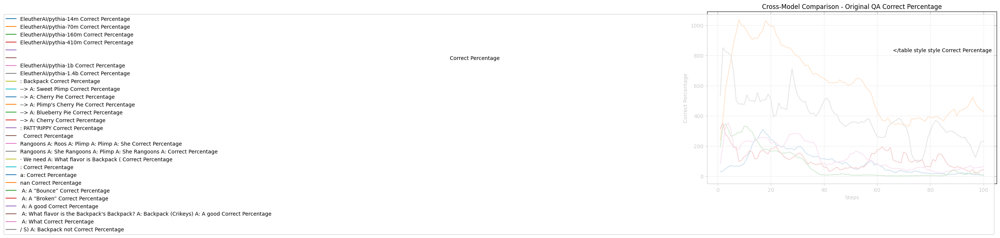

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: : PATT'RIPPY
Correlation analysis failed for : PATT'RIPPY: `x` and `y` must have length at least 2.
FFT analysis failed for : PATT'RIPPY: invalid number of data points (0) specified


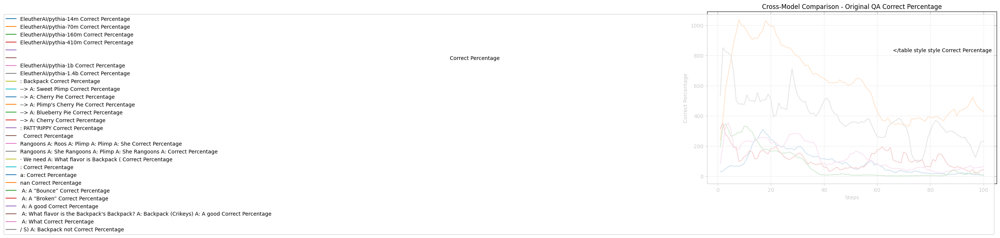

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model:  
Correlation analysis failed for  : `x` and `y` must have length at least 2.
FFT analysis failed for  : invalid number of data points (0) specified


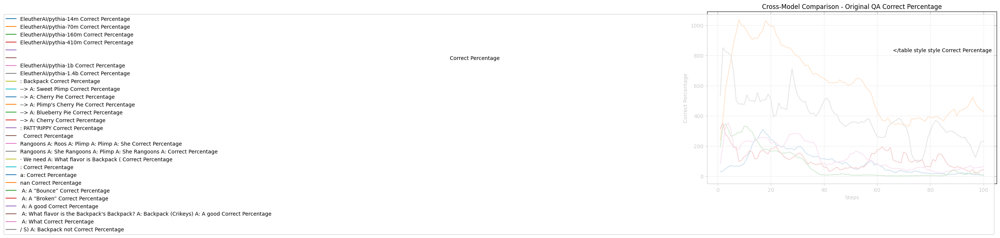

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: Rangoons A: Roos A: Plimp A: Plimp A: She
Correlation analysis failed for Rangoons A: Roos A: Plimp A: Plimp A: She: `x` and `y` must have length at least 2.
FFT analysis failed for Rangoons A: Roos A: Plimp A: Plimp A: She: invalid number of data points (0) specified


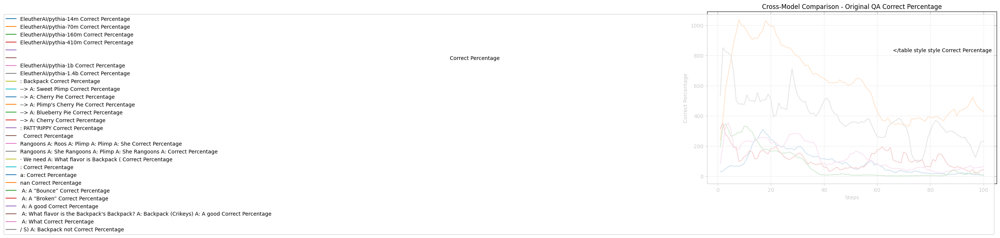

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: Rangoons A: She Rangoons A: Plimp A: She Rangoons A:
Correlation analysis failed for Rangoons A: She Rangoons A: Plimp A: She Rangoons A:: `x` and `y` must have length at least 2.
FFT analysis failed for Rangoons A: She Rangoons A: Plimp A: She Rangoons A:: invalid number of data points (0) specified


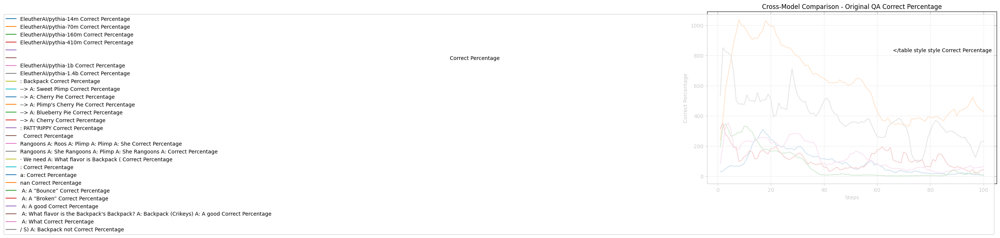

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: · We need A: What flavor is Backpack (
Correlation analysis failed for · We need A: What flavor is Backpack (: `x` and `y` must have length at least 2.
FFT analysis failed for · We need A: What flavor is Backpack (: invalid number of data points (0) specified


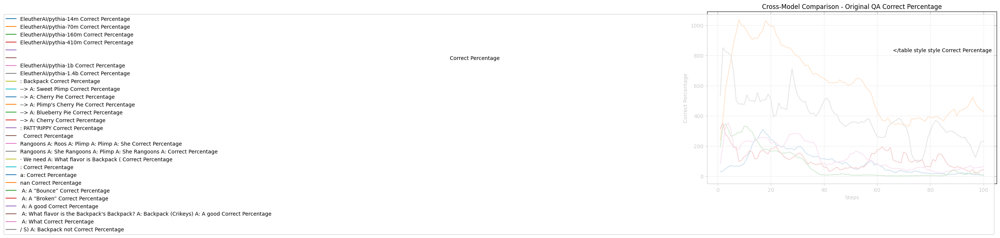

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: :
Correlation analysis failed for :: `x` and `y` must have length at least 2.
FFT analysis failed for :: invalid number of data points (0) specified


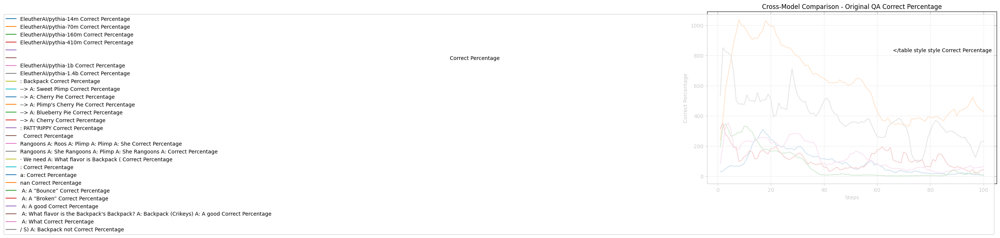

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: a:
Correlation analysis failed for a:: `x` and `y` must have length at least 2.
FFT analysis failed for a:: invalid number of data points (0) specified


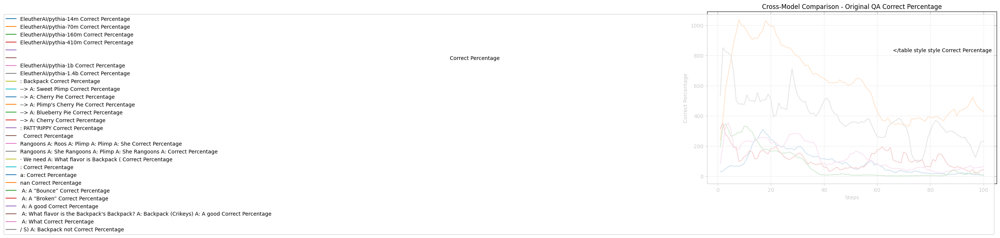

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: nan
Correlation analysis failed for nan: `x` and `y` must have length at least 2.
FFT analysis failed for nan: invalid number of data points (0) specified


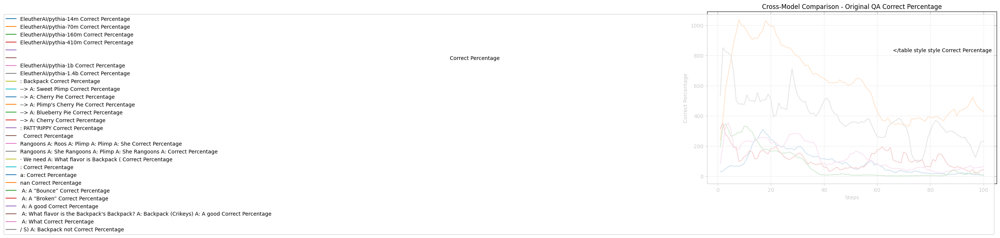

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model:  A: A “Bounce”
Correlation analysis failed for  A: A “Bounce”: `x` and `y` must have length at least 2.
FFT analysis failed for  A: A “Bounce”: invalid number of data points (0) specified


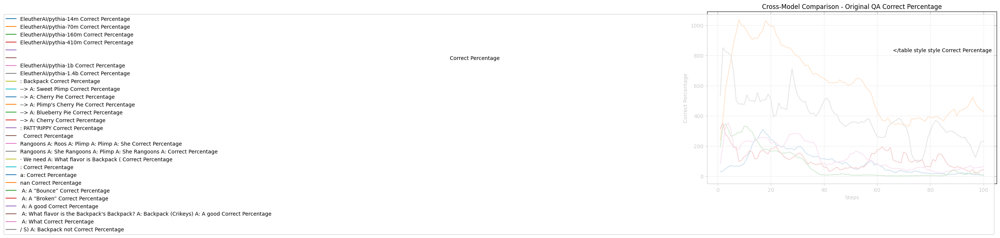

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model:  A: A “Broken”
Correlation analysis failed for  A: A “Broken”: `x` and `y` must have length at least 2.
FFT analysis failed for  A: A “Broken”: invalid number of data points (0) specified


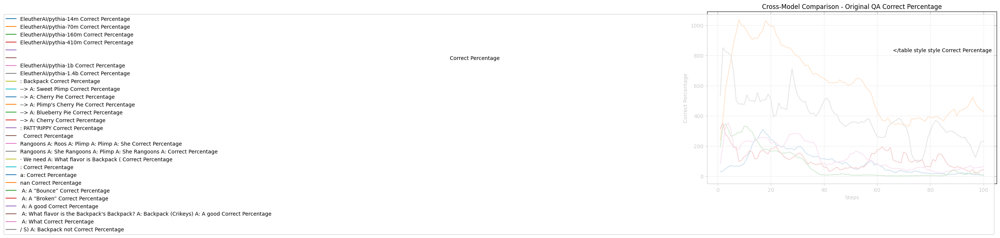

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model:  A: A good
Correlation analysis failed for  A: A good: `x` and `y` must have length at least 2.
FFT analysis failed for  A: A good: invalid number of data points (0) specified


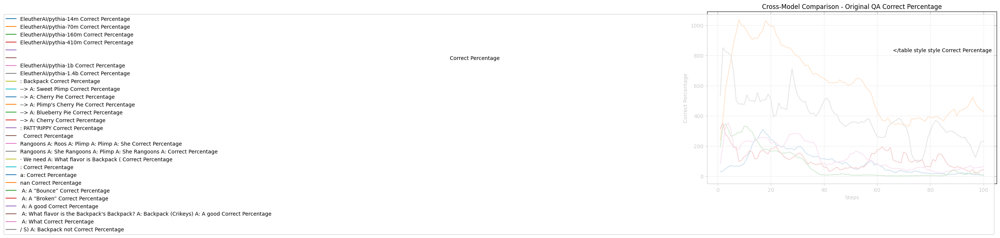

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model:  A: What flavor is the Backpack's Backpack? A: Backpack (Crikeys) A: A good
Correlation analysis failed for  A: What flavor is the Backpack's Backpack? A: Backpack (Crikeys) A: A good: `x` and `y` must have length at least 2.
FFT analysis failed for  A: What flavor is the Backpack's Backpack? A: Backpack (Crikeys) A: A good: invalid number of data points (0) specified


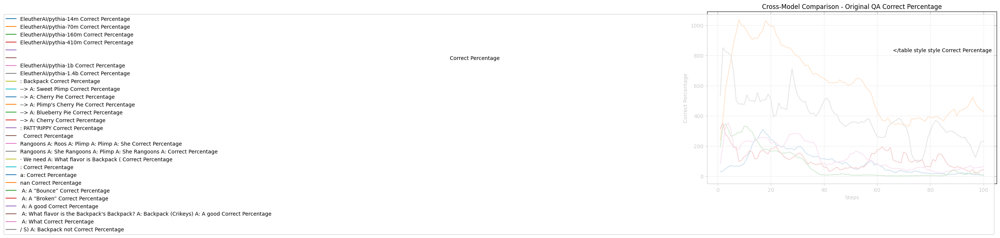

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model:  A: What
Correlation analysis failed for  A: What: `x` and `y` must have length at least 2.
FFT analysis failed for  A: What: invalid number of data points (0) specified


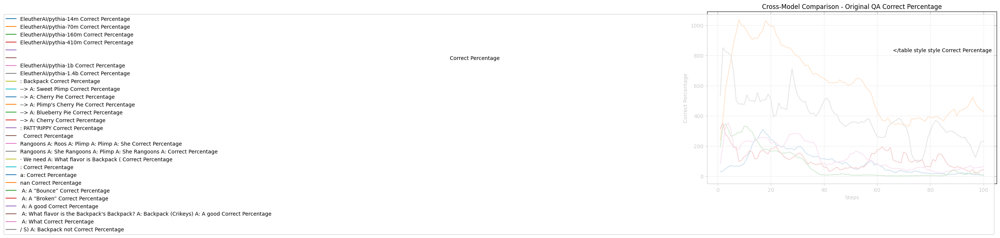

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan

Starting analyses for model: / S) A: Backpack not
Correlation analysis failed for / S) A: Backpack not: `x` and `y` must have length at least 2.
FFT analysis failed for / S) A: Backpack not: invalid number of data points (0) specified


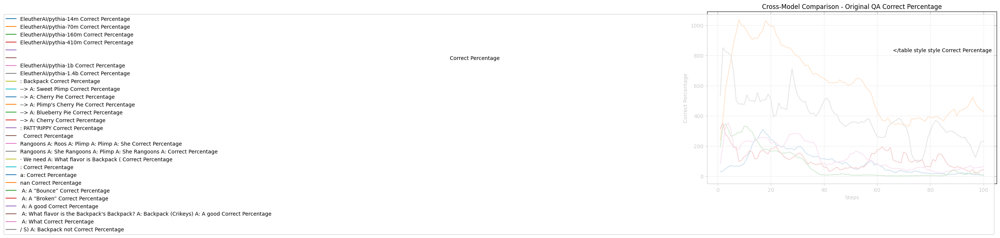

Epoch 1 (0-50) - Average Original QA Correct Percentage: nan
Epoch 1 (0-50) - Average Original QA Loss: nan
Epoch 2 (50-100) - Average Original QA Correct Percentage: nan
Epoch 2 (50-100) - Average Original QA Loss: nan
Epoch 3 (100-150) - Average Original QA Correct Percentage: nan
Epoch 3 (100-150) - Average Original QA Loss: nan


In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.stats import pearsonr

# Load the inference results CSV file (previously generated data)
inference_csv_file = 'experiments/full_run/inference_results.csv'
df = pd.read_csv(inference_csv_file)

# Load the training loss CSV file
loss_csv_file = '/workspace/slice-monorepo/sub_validations/episodic_memory_paper/experiments/full_run/training_loss.csv'
loss_df = pd.read_csv(loss_csv_file)

# Remove the bad data: QA pair 10 for "EleutherAI/pythia-1.4b" with the question "What flavor is the traditional pie in Plimp?"
df = df[~((df['Model Name'] == 'EleutherAI/pythia-1.4b') & (df['Question'] == 'What flavor is the traditional pie in Plimp?'))]
loss_df = loss_df[~((loss_df['Model Name'] == 'EleutherAI/pythia-1.4b') & (loss_df['Trained Question'] == 'What flavor is the traditional pie in Plimp?'))]

# Helper function for FFT analysis
def perform_fft(data, title):
    N = len(data)
    T = 1.0  # Assuming equal spacing between data points
    yf = fft(data)
    xf = np.linspace(0.0, 1.0 / (2.0 * T), N // 2)
    
    plt.figure()
    plt.plot(xf, 2.0 / N * np.abs(yf[:N // 2]))
    plt.title(f"FFT Analysis: {title}")
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.show()

# List of model names to compare across analyses
model_names = df['Model Name'].unique()

# Loop over models
for model_name in model_names:
    print(f"\nStarting analyses for model: {model_name}")
    
    # Filter data for the current model
    model_df = df[df['Model Name'] == model_name]
    loss_model_df = loss_df[loss_df['Model Name'] == model_name]

    # Prepare data for Original QA and Related QA
    original_qa_df = model_df[model_df['Type'] == 'pile']
    related_qa_df = model_df[model_df['Type'] == 'no_pile']

    # Assuming 'Correct Percentage' and 'Loss' have been pre-calculated
    original_correct_percentage = original_qa_df.groupby('Step')['Correct'].sum() / 400 * 100
    related_correct_percentage = related_qa_df.groupby('Step')['Correct'].sum() / 400 * 100
    original_loss = loss_model_df.groupby('Step')['Inference Loss'].mean()

    # 1. Correlation Between Loss and Accuracy
    try:
        # Correlation for Original QA
        corr_original, _ = pearsonr(original_correct_percentage.values, original_loss.values)
        print(f"Pearson correlation between Original QA Correct Percentage and Loss for {model_name}: {corr_original}")

        # Correlation for Related QA
        related_loss = original_loss  # Assuming the loss is only calculated for the Original QA
        corr_related, _ = pearsonr(related_correct_percentage.values, related_loss.values)
        print(f"Pearson correlation between Related QA Correct Percentage and Loss for {model_name}: {corr_related}")
    except Exception as e:
        print(f"Correlation analysis failed for {model_name}: {e}")

    # 2. Fourier Analysis of Sinusoidal Patterns
    try:
        # Perform FFT on Original QA Correct Percentage
        perform_fft(original_correct_percentage.values, f"{model_name} - Original QA Correct Percentage")

        # Perform FFT on Loss
        perform_fft(original_loss.values, f"{model_name} - Original QA Loss")
    except Exception as e:
        print(f"FFT analysis failed for {model_name}: {e}")

    # 3. Cross-Model Comparison
    try:
        if len(model_names) > 1:
            # Compare original_correct_percentage and loss values between models
            plt.figure(figsize=(10, 6))
            
            for compare_model_name in model_names:
                compare_model_df = df[df['Model Name'] == compare_model_name]
                compare_original_qa_df = compare_model_df[compare_model_df['Type'] == 'pile']
                compare_original_correct_percentage = compare_original_qa_df.groupby('Step')['Correct'].sum() / 400 * 100

                plt.plot(compare_original_correct_percentage.index, compare_original_correct_percentage.values, label=f"{compare_model_name} Correct Percentage")

            plt.title(f"Cross-Model Comparison - Original QA Correct Percentage")
            plt.xlabel("Steps")
            plt.ylabel("Correct Percentage")
            plt.legend(loc="upper right")
            plt.grid(True)
            plt.show()
        else:
            print(f"Not enough models for cross-model comparison for {model_name}")
    except Exception as e:
        print(f"Cross-model comparison failed for {model_name}: {e}")

    # 4. Epoch-Level Analysis
    try:
        # Divide the steps into epoch boundaries and compare
        # Assuming 'Epoch' field is available or epoch boundaries are known
        epoch_boundaries = [0, 50, 100, 150]  # Adjust as per your data

        for j in range(1, len(epoch_boundaries)):
            epoch_start = epoch_boundaries[j - 1]
            epoch_end = epoch_boundaries[j]

            epoch_original_qa = original_correct_percentage[(original_correct_percentage.index >= epoch_start) & (original_correct_percentage.index <= epoch_end)]
            epoch_loss = original_loss[(original_loss.index >= epoch_start) & (original_loss.index <= epoch_end)]

            print(f"Epoch {j} ({epoch_start}-{epoch_end}) - Average Original QA Correct Percentage: {epoch_original_qa.mean()}")
            print(f"Epoch {j} ({epoch_start}-{epoch_end}) - Average Original QA Loss: {epoch_loss.mean()}")

    except Exception as e:
        print(f"Epoch-level analysis failed for {model_name}: {e}")



In [5]:
import os
import json
import pandas as pd

# Function to load configuration from the experiment folder
def load_config(experiment_folder):
    config_path = os.path.join(experiment_folder, "config.json")
    with open(config_path, 'r') as config_file:
        config = json.load(config_file)
    return config

# Function to load CSV files into DataFrames
def load_csv(experiment_folder, file_name):
    csv_path = os.path.join(experiment_folder, file_name)
    if os.path.exists(csv_path):
        return pd.read_csv(csv_path)
    else:
        raise FileNotFoundError(f"{file_name} not found in {experiment_folder}")

# Generate a summary for each model based on the CSV data
def generate_summary(experiment_folder):
    config = load_config(experiment_folder)
    
    # Load the training loss and inference result CSV files
    training_loss_df = load_csv(experiment_folder, "training_loss.csv")
    inference_results_df = load_csv(experiment_folder, "inference_results.csv")

    # Load the QA questions and follow-up questions from the config JSON file
    with open(config["qa_data_file"], 'r') as qa_file:
        qa_data = json.load(qa_file)
        qa_questions = qa_data['qa_data']['question']
        follow_up_questions = qa_data['follow_up_qa_data']['question']

    # For each model in the config
    for model_name in config["model_names"]:
        print(f"\nModel: {model_name}")

        # Summarize training losses and pile training
        summarize_training_loss(training_loss_df, model_name)

        # Summarize inference results for each question in the QA set
        summarize_inference_results(inference_results_df, model_name, qa_questions, follow_up_questions)

# Summarize the training loss for both QA training and Pile training
def summarize_training_loss(training_loss_df, model_name):
    # Filter the results for the specific model
    model_training_loss = training_loss_df[training_loss_df["Model Name"] == model_name]

    # Separate no_pile and pile training loss
    no_pile_loss = model_training_loss[model_training_loss["Type"] == "no_pile"]
    pile_loss = model_training_loss[model_training_loss["Type"] == "pile"]

    # Print training loss for the QA examples (no_pile)
    for _, row in no_pile_loss.iterrows():
        print(f"Epoch: {int(row['Step'])}, Training Loss: {row['Loss']:.4f}")

    # Print pile training loss by step
    for _, row in pile_loss.iterrows():
        print(f"Pile Step {int(row['Step'])}: Training Loss: {row['Loss']:.4f}")

# Summarize inference results for each QA pair and its related follow-up
def summarize_inference_results(inference_results_df, model_name, qa_questions, follow_up_questions):
    # Filter inference results for the specific model
    model_inference_results = inference_results_df[inference_results_df["Model Name"] == model_name]

    # Process inference results for each QA question
    for idx, trained_question in enumerate(qa_questions):
        related_question = follow_up_questions[idx]

        # Filter by the question and step
        no_pile_results = model_inference_results[(model_inference_results["Trained"] == trained_question) & (model_inference_results["Type"] == "no_pile")]
        pile_results = model_inference_results[(model_inference_results["Trained"] == trained_question) & (model_inference_results["Type"] == "pile")]

        # Summarize no_pile (QA and related QA) results
        summarize_correct_counts(no_pile_results, trained_question, related_question, "no_pile")

        # Summarize pile results
        pile_steps = pile_results["Step"].unique()
        for step in pile_steps:
            pile_step_results = pile_results[pile_results["Step"] == step]
            summarize_correct_counts(pile_step_results, trained_question, related_question, f"pile step {step}")

# Summarize correct counts for QA and related QA questions
def summarize_correct_counts(results_df, trained_question, related_question, phase):
    # Calculate correct counts for QA and related QA
    qa_correct = results_df[(results_df["Question"] == trained_question) & (results_df["Correct"] == True)].shape[0]
    related_correct = results_df[(results_df["Question"] == related_question) & (results_df["Correct"] == True)].shape[0]
    total_inferences = results_df[(results_df["Question"] == trained_question)].shape[0]

    print(f"{phase}: QA: Correct {qa_correct} / {total_inferences}, Related QA: Correct {related_correct} / {total_inferences}")

# Main function to run the summary generation
if __name__ == "__main__":
    experiment_folder = "experiments/single_example_inference_with_pile"  # Change this to your experiment folder path
    generate_summary(experiment_folder)



Model: EleutherAI/pythia-14m
Epoch: 1, Training Loss: 12.1997
Epoch: 2, Training Loss: 0.6698
Epoch: 1, Training Loss: 11.1490
Epoch: 2, Training Loss: 0.7464
Epoch: 1, Training Loss: 10.9718
Epoch: 2, Training Loss: 0.7016
Epoch: 1, Training Loss: 13.3651
Epoch: 2, Training Loss: 0.9562
Epoch: 1, Training Loss: 10.4719
Epoch: 2, Training Loss: 0.7792
Epoch: 1, Training Loss: 11.1999
Epoch: 2, Training Loss: 0.9773
Epoch: 1, Training Loss: 13.9916
Epoch: 2, Training Loss: 0.8929
Epoch: 1, Training Loss: 11.3979
Epoch: 2, Training Loss: 0.6943
Epoch: 1, Training Loss: 10.3480
Epoch: 2, Training Loss: 0.7578
Epoch: 1, Training Loss: 12.8124
Epoch: 2, Training Loss: 0.8111
Pile Step 1: Training Loss: 2.0945
Pile Step 2: Training Loss: 3.6888
Pile Step 3: Training Loss: 4.8290
Pile Step 4: Training Loss: 1.0588
Pile Step 5: Training Loss: 3.7162
Pile Step 6: Training Loss: 4.0433
Pile Step 7: Training Loss: 4.2108
Pile Step 8: Training Loss: 4.6576
Pile Step 9: Training Loss: 4.5546
Pile 